# Исследование рынка общественного питания в Москве

Инвесторы хотят открыть новое заведение общественного питания в Москве и обратились к нам, какм к аналитикам, за помощью. Нужно подготовить исследование рынка общественного питания в Москве и помочь инвесторам принять решение по поводу открытия нового заведения.  

-----------
**Цель исследования**

Необходимо проанализировать рынок общественного питания, найти интересные особенности и предоставить результаты, которые  помогут инвесторам выбрать подходящее место для нового заведения.  

-------------
**Исходные данные**
В датасете с общественными заведениями Москвы представлены данные с сервисов Яндекс Карты и Яндекс Бизнес на лето 2022. В датасете представлена информация о названии заведений, их адрес, категория, часы работы, рейтинг, категория цен, географическая широта и долгота.  

-----
**Задачи исследования** 

Для выполнения поставленной задачи нужно будет выполнить несколько шагов:  

***Шаг 1. Изучение общей информации*** 

* [Анализ датафрейма, изучение предоставленых данных и поиск в них проблемных мест](#Шаг-1.-Загрузка-данных ) 

***Шаг 2. Предобработка данных***
* [1. Обработка пропущенных значений](#Обработка-пропущенных-значений)
* [2. Создание новых столбцов](#Создание-новых-столбцов)

***Шаг 3. Анализ данных***
* [1. Категории объектов](#Категории-объектов)
* [2. Количество посадочных мест по категориям](#Количество-посадочных-мест-по-категориям)
* [2.1. Среднее количество посадочных мест по категориям](#Среднее-количество-посадочных-мест-по-категориям)
* [3. Соотношение сетевых и несетевых заведений](#Соотношение-сетевых-и-несетевых-заведений)
* [4. Сетевые категории заведений](#Сетевые-категории-заведений)
* [5. Топ-15 популярных сетей в Москве](#Топ-15-популярных-сетей-в-Москве)
* [5.1. Топ-15 популярных сетей с сортировкой по категориям](#Топ-15-популярных-сетей-с-сортировкой-по-категориям)
* [6. Административные районы Москвы](#Административные-районы-Москвы)
* [7. Средние рейтинги по категориям](#Средние-рейтинги-по-категориям)
* [8. Фоновая диаграмма со средним рейтингом заведений каждого района](#Фоновая-диаграмма-со-средним-рейтингом-заведений-каждого-района)
* [9. Все заведения на карте](#Все-заведения-на-карте)
* [10. Топ-15 улиц по количеству заведений](#Топ-15-улиц-по-количеству-заведений)
* [11. Улицы с 1 объектом](#Улицы-с-1-объектом)
* [12. Анализ средних чеков заведений](#Анализ-средних-чеков-заведений)
* [13. Вывод](#Вывод)


***Шаг 4. Открытие кофейни***
* [1. Количество кофеен](#Количество-кофеен)
* [2. Круглосуточные кофейни](#Круглосуточные-кофейни)
* [3. Рейтинги кофеен](#Рейтинги-кофеен)
* [4. Стоимость чашки капучино](#Стоимость-чашки-капучино)
* [5. Вывод по открытию кофейни](#Вывод-по-открытию-кофейни)

***Шаг 5. Презентация***
* [Презентация](#Шаг.-5.-Презентация)

***Шаг 6. Составление общего вывода***
* [Вывод](#Шаг-6.-Общий-вывод:)

#### Шаг 1. Загрузка данных

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
from plotly import graph_objects as go
import plotly.express as px
import json

from folium import Map, Choropleth, Marker
from folium.plugins import MarkerCluster

In [2]:
places = pd.read_csv('/datasets/moscow_places.csv')
display(places.head())

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


In [3]:
places.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


In [4]:
print('Количество явных дубликатов в датафрейме:', places.duplicated().sum())

Количество явных дубликатов в датафрейме: 0


In [5]:
print(places[places.duplicated(subset=['category', 'address', 'rating'], keep=False)])

                  name         category  \
20      Чебуреки Манты             кафе   
31             Алталия  быстрое питание   
41     Крошка Картошка  быстрое питание   
55    Чебуреки и манты             кафе   
242    Греческая кухня  быстрое питание   
...                ...              ...   
8322       Кафе Лесное         пиццерия   
8329        Вкус Жизни         столовая   
8386       Греки Здесь         ресторан   
8389              Assa         ресторан   
8401        Суши Мания             кафе   

                                                address  \
20                      Москва, Правобережная улица, 1Б   
31                           Москва, улица Дыбенко, 7/1   
41                           Москва, улица Дыбенко, 7/1   
55                      Москва, Правобережная улица, 1Б   
242                      Москва, МКАД, 87-й километр, 8   
...                                                 ...   
8322  Москва, природно-исторический парк Кузьминки-Л...   
8329       

In [6]:
result = places[places['name'].str.contains('Чебуреки', 'Манты', na=False)]
print(result)

                         name         category  \
20             Чебуреки Манты             кафе   
55           Чебуреки и манты             кафе   
376            Чебуреки Манты             кафе   
5958  Чебуреки Воробьевы горы  быстрое питание   
6450                 Чебуреки         ресторан   

                                          address  \
20                Москва, Правобережная улица, 1Б   
55                Москва, Правобережная улица, 1Б   
376   Москва, улица Адмирала Макарова, 6, стр. 13   
5958               Москва, Андреевская набережная   
6450           Москва, улица Старые Кузьминки, 11   

                                  district  \
20         Северный административный округ   
55         Северный административный округ   
376        Северный административный округ   
5958   Юго-Западный административный округ   
6450  Юго-Восточный административный округ   

                                     hours        lat        lng  rating  \
20                  ежеднев

In [7]:
print(result[result.duplicated(subset=['address'], keep=False)])

                name category                          address  \
20    Чебуреки Манты     кафе  Москва, Правобережная улица, 1Б   
55  Чебуреки и манты     кафе  Москва, Правобережная улица, 1Б   

                           district                   hours        lat  \
20  Северный административный округ  ежедневно, 10:00–22:00  55.880287   
55  Северный административный округ  ежедневно, 10:00–22:00  55.880288   

          lng  rating price avg_bill  middle_avg_bill  middle_coffee_cup  \
20  37.448646     4.3   NaN      NaN              NaN                NaN   
55  37.448645     4.3   NaN      NaN              NaN                NaN   

    chain  seats  
20      1  148.0  
55      0  148.0  


In [8]:
places = places.drop(55, errors='ignore')
places = places.drop(242, errors='ignore')

In [9]:
print(places[places.duplicated(subset=['category', 'address', 'rating'], keep=False)])

                 name         category  \
31            Алталия  быстрое питание   
41    Крошка Картошка  быстрое питание   
264             Акбаш         ресторан   
272   Крошка Картошка  быстрое питание   
277          Pho' mos  быстрое питание   
...               ...              ...   
8322      Кафе Лесное         пиццерия   
8329       Вкус Жизни         столовая   
8386      Греки Здесь         ресторан   
8389             Assa         ресторан   
8401       Суши Мания             кафе   

                                                address  \
31                           Москва, улица Дыбенко, 7/1   
41                           Москва, улица Дыбенко, 7/1   
264                          Москва, Полярная улица, 21   
272                      Москва, МКАД, 87-й километр, 8   
277                      Москва, МКАД, 87-й километр, 8   
...                                                 ...   
8322  Москва, природно-исторический парк Кузьминки-Л...   
8329            Москва,

В датафрейме 8 406 строк и 14 столбцов. В столбцах 'hours', 'price', 'avg_bill', 'middle_avg_bill', 'middle_coffe_cup' и 'seats' присутствуют пропущенные данные. Данные в столбцах имеют правильный тип данных. Названия столбцов соответствуют змеиному регистру. Явных дубликатов в датафрейме не обнаружено. Неявные были обработаны.

In [10]:
#Количество уникальных названий заведений
places['name'].nunique()

5612

#### Шаг 2. Предобработка данных

##### Обработка пропущенных значений

In [11]:
#Проверим количество пропущенных значений в столбцах
places.isnull().sum()

name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5089
avg_bill             4588
middle_avg_bill      5255
middle_coffee_cup    7869
chain                   0
seats                3610
dtype: int64

In [12]:
columns = ['hours', 'price', 'avg_bill']
for column in columns:
    places[column] = places[column].fillna('unknown')

In [13]:
places.isnull().sum()

name                    0
category                0
address                 0
district                0
hours                   0
lat                     0
lng                     0
rating                  0
price                   0
avg_bill                0
middle_avg_bill      5255
middle_coffee_cup    7869
chain                   0
seats                3610
dtype: int64

##### Создание новых столбцов

In [14]:
#Создаём столбец с названиями улиц
places['street'] = places['address'].str.split(',').str[1].str.strip()

In [15]:
#Создаём столбец с обозначением, что заведение работает круглосуточно
places['is_24_7'] = places['hours'].str.contains(r'круглосуточно|00:00–24:00')&places['hours'].str.contains(r'ежедневно')
places['is_24_7'] = places['is_24_7'].fillna(False)

In [16]:
#Проверим, что новые столбцы были добавлены в датафрейм
display(places.head())

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,unknown,unknown,NaN,NaN,0,NaN,улица Дыбенко,False
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица Дыбенко,False
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,Клязьминская улица,False
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,unknown,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица Маршала Федоренко,False
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,Правобережная улица,False


#### Шаг 3. Анализ данных

##### Категории объектов

In [17]:
places['category'].unique()

array(['кафе', 'ресторан', 'кофейня', 'пиццерия', 'бар,паб',
       'быстрое питание', 'булочная', 'столовая'], dtype=object)

In [18]:
count = places['category'].value_counts()
display(count)

кафе               2377
ресторан           2043
кофейня            1413
бар,паб             765
пиццерия            633
быстрое питание     602
столовая            315
булочная            256
Name: category, dtype: int64

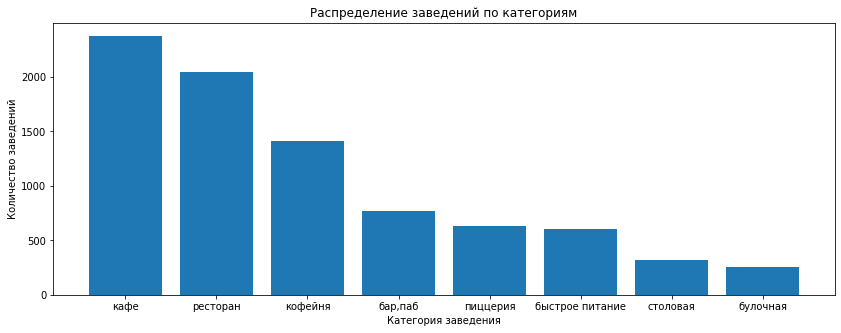

In [19]:
plt.figure(figsize=(14,5))
plt.bar(count.index, count)
plt.xlabel('Категория заведения')
plt.ylabel('Количество заведений')
plt.title('Распределение заведений по категориям');

Самое большое количество заведений представлено в категориях кафе (2377) и ресторан (2043). Это свидетельствует о спросе на заведения, предлагающие полноценные блюда и напитки. Кофейни занимают третье по популярности место, что может показывать на высокую культуру кофе в городе. Бары, пабы и пиццерии и заведения быстрого питания менее популярны, чем кафе, рестораны и кофейни, но тоже представляют значимую часть всех заведений. Самое небольшое количество заведений представлено в категориях столовая (315) и булочная (256). Это может говорить о том, что данные категории пользуются меньшей популярностью у жителей города.

##### Количество посадочных мест по категориям

In [20]:
seats_count = places.groupby('category')['seats'].sum()
seats_count = seats_count.sort_values(ascending=False)
display(seats_count)

category
ресторан           154869.0
кафе               118622.0
кофейня             83511.0
бар,паб             58281.0
пиццерия            40350.0
быстрое питание     34513.0
столовая            16359.0
булочная            13229.0
Name: seats, dtype: float64

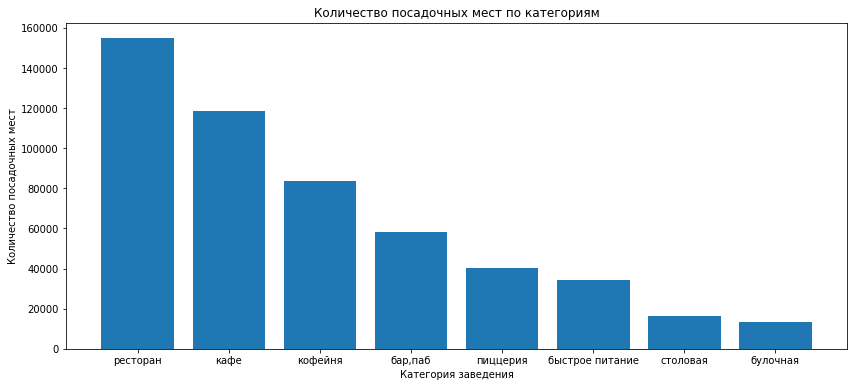

In [21]:
plt.figure(figsize=(14,6))
plt.bar(seats_count.index, seats_count)
plt.xlabel('Категория заведения')
plt.ylabel('Количество посадочных мест')
plt.title('Количество посадочных мест по категориям');

По количеству посадочных  мест так же, как и в предыдущем анализе, лидирующие позиции занимают рестораны и кафе (154 869 и 118 622 посадочных мест соответственно). Это можно объяснить тем, что самое большое количество заведений представлено именно в данных категориях, и тем, что рестораны обычно расчитаны на большое количество посадочных мест в нескольких залах. Формат кафе так же обычно предполагает достаточное количество мест для посетителей. Кофейни преставляют ещё одну важную категорию, с большим количестврм посадочных мест (83 511). Обычно кофейни гораздо меньше по размеру, чем рестораны или кафе, но и они рассчитаны на создание благоприятной атмосферы гостям, и располагают достаточным количеством посадочных мест.  
Бары и пабы так же имеют достаточное количество посадочных мест (58 281), что говорит о популярности данного типа заведений среди жителей.  
Пиццерии и заведения быстрого питания имеют меньшее количество посадочных мест, что обусловлено их меньшими размерами и направленностью заведений - еду можно  взять на вынос, и большое количество посадочных мест не требуется.  
Столовые и булочные имеют самое маленькое количество посадочных мест - это обусловлено тем, что в этих категориях меньше всего заведений, и тем, что эти заведения рассчитаны на быстрые визиты посетителей и обычно не располагают достаточным количеством мест.

###### Среднее количество посадочных мест по категориям

In [22]:
seats_median = places.groupby('category')['seats'].median()
seats_median = seats_median.sort_values(ascending=False)
display(seats_median)

category
ресторан           86.0
бар,паб            82.5
кофейня            80.0
столовая           75.5
быстрое питание    65.0
кафе               60.0
пиццерия           55.0
булочная           50.0
Name: seats, dtype: float64

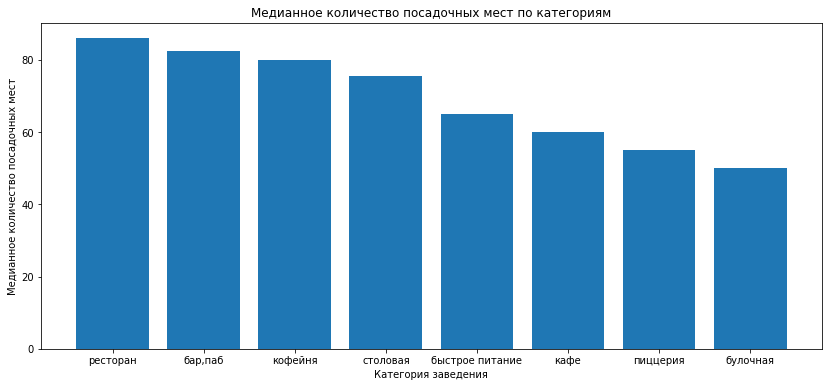

In [23]:
plt.figure(figsize=(14,6))
plt.bar(seats_median.index, seats_median)
plt.xlabel('Категория заведения')
plt.ylabel('Медианное количество посадочных мест')
plt.title('Медианное количество посадочных мест по категориям');

В среднем больше всего посадочных мест предлагают рестораны и бары,пабы. Это может быть связано с тем, что данные категории часто ориентированы на большие залы с большим потоком клиентов, для чего требуется большое количество посадочных мест.  
Кофейни, столовые и кафе обладают немного меньшими помещениями, но в основном так же располагают достаточным количеством посадочных мест.  
Меньше всего посадочных мест у пиццерий и булочных. Это объясняется тем, что такие заведения часто работают в формате "на вынос", и не требуют большого количества мест.

##### Соотношение сетевых и несетевых заведений

In [24]:
chain_count = places['chain'].value_counts()
display(chain_count)

0    5199
1    3205
Name: chain, dtype: int64

In [25]:
chains = ['Несетевое','Сетевое']
fig= go.Figure(data=[go.Pie(labels=chains, values=chain_count)])
fig.update_layout(
    title = 'Соотношение сетевых и несетевых заведений',
    width = 700,
    height = 500
)
fig.show()

Больше половины (61,9%) составлют несетевые заведения. Это может быть связано с тенденцией открывать независимые рестораны, кафе, котрые не являются частью какой-либо сети. 

##### Сетевые категории заведений

In [26]:
chain_category = places.groupby('category')['chain'].mean()
chain_category = chain_category.sort_values(ascending=False)

fig = px.bar(chain_category, x= chain_category.index, y= chain_category.values,
            labels = {'category':'Категория заведения', 'y':'Доля сетевых заведений'},
            title = 'Доля сетевых заведений по категориям')
#fig = px.bar(chain_category,
             #labels = {'chain':'Доля сетевых заведений', 'category':'Категория'},
             #title = 'Доля сетевых заведений по категориям')

fig.show()

Сетевыми заведениями чаще всего являются булочные, пиццерии и кофейни. Это говорит о том, что в этих категориях заведений крупные сетевые бренды играют большую роль.  
Меньше всего сетевых заведений в категориях столовая и бар,паб. Это говорит о большом преобладании независимых заведений, предлагающих уникальное мегю и обслуживание.

##### Топ-15 популярных сетей в Москве

In [27]:
chain_places = places[places['chain']==1]

top_chains = chain_places.groupby('name')['chain'].count()
top_chains = top_chains.sort_values(ascending=False).head(15)

fig = px.bar(top_chains,
            labels={'name':'Сеть', 'value':'Количество заведений'},
            title = 'Топ-15 популярных сетей')
fig.show();

Самыми популярными являются сети Шоколадница (120). Далее с практически одинаковыми результатами следуют Доминос Пицца (76), Додо Пицца (74), One Price Coffee (71), Яндекс Лавка (69) и Cofix (65). Все эти сети хорошо известны и достаточно широко распространены.
Замыкают топ-15 CofeFest (32), Буханка (32) и Му-Му (27).


In [28]:
top_chain_name = top_chains.index
top_chain_category = chain_places[chain_places['name'].isin(top_chain_name)]['category']
top_chain_category_count = top_chain_category.value_counts()
display(top_chain_category_count)

кофейня            336
ресторан           186
пиццерия           151
кафе               100
булочная            25
быстрое питание     12
бар,паб              4
столовая             2
Name: category, dtype: int64

Как мы видим, в данных сетях преобладают кофейни, рестораны и пиццерии.

###### Топ-15 популярных сетей с сортировкой по категориям

In [29]:
# Группируем по названиям заведений и категориям, считаем количество заведений
category_counts = chain_places.groupby(['name', 'category']).size().reset_index(name='count')

# Считаем общее количество заведений для каждой сети
total_counts = category_counts.groupby('name')['count'].sum().sort_values(ascending=False).head(15)

# Получаем категории для сетей с топ-15 количеством заведений
top_15_categories = category_counts[category_counts['name'].isin(total_counts.index)]
top_15_categories = top_15_categories.sort_values(by='count', ascending=False)

fig = px.bar(top_15_categories,
             x='name', y='count', color='category', 
             title='Топ-15 популярных сетей в Москве по категориям заведений',
             labels={'name': 'Сеть', 'count': 'Количество заведений', 'category': 'Категория'})

fig.show()

##### Административные районы Москвы

In [30]:
places['district'].unique()

array(['Северный административный округ',
       'Северо-Восточный административный округ',
       'Северо-Западный административный округ',
       'Западный административный округ',
       'Центральный административный округ',
       'Восточный административный округ',
       'Юго-Восточный административный округ',
       'Южный административный округ',
       'Юго-Западный административный округ'], dtype=object)

В датасете присутствует 9 административных округов.

In [31]:
#Количество заведений по районам
district_count = places.groupby('district')['name'].count().sort_values(ascending=False)

#Количество заведений каждой категории по районам
category_district = places.groupby(['district', 'category'])['name'].count().unstack().loc[district_count.index]

In [32]:
fig = px.bar(category_district,
           labels = {'district':'Административный район', 'value': 'Количество заведений'},
            title = 'Количество заведений по районам и категориям')
fig.show();

In [33]:
print('Количество заведений по районам:')
display(district_count)

Количество заведений по районам:


district
Центральный административный округ         2242
Северный административный округ             899
Южный административный округ                892
Северо-Восточный административный округ     890
Западный административный округ             851
Восточный административный округ            798
Юго-Восточный административный округ        714
Юго-Западный административный округ         709
Северо-Западный административный округ      409
Name: name, dtype: int64

In [34]:
category_district

category,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая
district,,,,,,,,
Центральный административный округ,364,50,87,464,428,113,670,66
Северный административный округ,68,39,58,234,193,77,189,41
Южный административный округ,68,25,85,264,131,73,202,44
Северо-Восточный административный округ,63,28,81,269,159,68,182,40
Западный административный округ,50,37,62,239,150,71,218,24
Восточный административный округ,53,25,71,272,105,72,160,40
Юго-Восточный административный округ,38,13,67,282,89,55,145,25
Юго-Западный административный округ,38,27,61,238,96,64,168,17
Северо-Западный административный округ,23,12,30,115,62,40,109,18


Больше всего заведений в Центральном округе, из них больше всего ресторанов, кафе и кофеен. Далее по количеству заведений идут Северный, Южный, Северо-Восточный и Западный округа. В них самыми популярными категориями заведений также являются кафе, рестораны и кофейни.

##### Средние рейтинги по категориям

In [35]:
rating_mean = places.groupby('category')['rating'].mean().sort_values(ascending=False)
display(round(rating_mean, 2))

category
бар,паб            4.39
пиццерия           4.30
ресторан           4.29
кофейня            4.28
булочная           4.27
столовая           4.21
кафе               4.12
быстрое питание    4.05
Name: rating, dtype: float64

In [36]:
fig = px.bar(rating_mean,
            labels= {'category':'Категория заведения', 'value': 'Средний рейтинг'},
            title = 'Средние рейтинги по категориям заведений',
            color = rating_mean,
            color_continuous_scale = 'Blues')
fig.show()

Самый высокий рейтинг у категории бар, паб (4,39). Это может говорить о высоком уровне обслкживания в данных заведениях и располагающей атмосфере. На втором месте категория пиццерия (4,3). Это тоже достаточно высокий рейтинг, что может быть связано с хорошим качеством еды и сервисом. Рестораны (4,29), кофейни (4,28) и булочные (4,27) имеют чуть более низкий рейтинг, но так же довольно высокий, что говорит о положительном восприятии данных заведений посетителями.  
Столовые и кафе имеют более низкие рейтинги, что может быть причиной разного качества обслуживания в разных местах, а так же использованием продуктов разного качества.  
Самый низкий рейтинг (4,05) у категории быстрое питание. Это может быть связано с массовостью, стандартизацией меню и более низким качеством обслуживания.  
Из анализа видно, что заведения, которые предлагают более разнообразное меню, приятную атмосферу и хороший уровень обслуживания, обычно получают более высокий рейтинг. В то время как категории, ориентированные на более массовое посещение и более низкие стандарты обслуживания, получают более низкие рейтинги.

##### Фоновая диаграмма со средним рейтингом заведений каждого района

In [37]:
rating_district = places.groupby('district', as_index=False)['rating'].agg('mean')
rating_district = round(rating_district, 2)
print(rating_district.sort_values(by='rating', ascending=False))

                                  district  rating
5       Центральный административный округ    4.38
2          Северный административный округ    4.24
4   Северо-Западный административный округ    4.21
1          Западный административный округ    4.18
8             Южный административный округ    4.18
0         Восточный административный округ    4.17
7      Юго-Западный административный округ    4.17
3  Северо-Восточный административный округ    4.15
6     Юго-Восточный административный округ    4.10


In [38]:
with open ('/datasets/admin_level_geomap.geojson', 'r') as f:
    geo_json = json.load(f)
    
#print(json.dumps(geo_json, indent=2, ensure_ascii=False, sort_keys=True))

In [39]:
state_geo = '/datasets/admin_level_geomap.geojson'
moscow_lat, moscow_lng = 55.751244, 37.618423
m = Map(location = [moscow_lat, moscow_lng], zoom_start = 10, tiles='Cartodb Positron')

Choropleth(
geo_data=state_geo,
data = rating_district,
columns = ['district', 'rating'],
key_on = 'feature.name',
fill_color = 'PuBuGn',
fill_opacity = 0.8,
legend_name = 'Средний рейтинг заведений по районам',).add_to(m)

m

Наивысший средний рейтинг имеют заведения в Центральном административном округе (4,38). Это можно объяснить тем, что, вероятно,заведения, находящиеся в центре, предлагают более высокое качество обслуживания или уникальные предложения (например, меню), что представляет интерес для посетителей. Так же это может быть связано с большим количеством заведений разных категорий в данном районе, и более высокой проходимостью заведений.  
Далее следует Северный административный округ (4,24) и Северо-Западный административный округ (4,21). Самый низкий средний рейтинг (4,10) у заведений в Юго-Восточном административном округе.  

##### Все заведения на карте

In [40]:
mm = Map(location = [moscow_lat, moscow_lng], zoom_start = 10, tiles='Cartodb Positron')
marker_cluster = MarkerCluster().add_to(mm)

def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",).add_to(marker_cluster)
    
places.apply(create_clusters, axis=1)

mm

##### Топ-15 улиц по количеству заведений

In [41]:
streets_count = places.groupby('street')['name'].count().sort_values(ascending=False)
top15_streets = streets_count.head(15)
top_15_streets = places[places['street'].isin(top15_streets.index)]

category_counts = top_15_streets.groupby(['street', 'category'])['name'].count().reset_index(name ='count')
category_counts['total'] = category_counts.groupby('street')['count'].transform('sum')
category_counts = category_counts.sort_values(by='total', ascending=False)

#street_total_counts = category_counts.groupby('street')['count'].sum().sort_values(ascending=False)
#category_counts = category_counts[category_counts['street'].isin(street_total_counts.index)]
#category_counts_sorted = category_counts[category_counts['street'].isin(street_total_counts.index)]

fig = px.bar(category_counts,
            x='street', y='count', color='category',
            title = 'Топ-15 улиц по количеству заведений по категориям',
            labels = {'street': 'Улица', 'count': 'Количество заведений', 'category': 'Категория'})

fig.show()

In [42]:
#streets_count = places.groupby(['street', 'category']).size().reset_index(name='count')
#total_streets_count = streets_count.groupby('street')['count'].sum().sort_values(ascending=False).head(15)
#top15_streets = streets_count[streets_count['street'].isin(total_streets_count.index)]
#top15_streets = top15_streets.sort_values(by='count', ascending=False)

#fig = px.bar(top15_streets,
            #x='street', y='count', color='category',
            #title = 'Топ-15 улиц по количеству заведений по категориям',
            #labels = {'street': 'Улица', 'count': 'Количество заведений', 'category': 'Категория'})

#fig.show()

In [43]:
#total_streets_count

In [44]:
top15_streets

street
проспект Мира             184
Профсоюзная улица         122
проспект Вернадского      108
Ленинский проспект        107
Ленинградский проспект     95
Дмитровское шоссе          88
Каширское шоссе            77
Варшавское шоссе           76
Ленинградское шоссе        70
МКАД                       64
Люблинская улица           60
улица Вавилова             55
Кутузовский проспект       54
улица Миклухо-Маклая       49
Пятницкая улица            48
Name: name, dtype: int64

Больше всего заведений сконцентрировано на Проспекте Мира. Это может говорить о том, что там хорошая транспортная доступность, большое количество посетителей, высокий спрос на заведения питания. На втором месте Профсоюзная улица. В этом районе находится много торговых центров, бизнес центров, а также учебные заведения - что делает заведения общественного питания достаточно популярными. На третьем и четвёртом местах проспект Вернадского и Ленинский проспект - эти улицы так же находятся недалеко от учебных заведений, жилых комплексов и бизнес центров. Поэтому заведения, где можно поесть, там достаточно востребованы.  
Ленинградский проспект, Дмитровское шоссе, Каширское шоссе и Варшавское шоссе находятся немного в стороне от центра, но являются важными транспортными узлами. Эти улицы соединяют разные районы Москвы и там всегда большое количество людей.

##### Улицы с 1 объектом

In [45]:
streets_count_1 = streets_count[streets_count==1]
streets_count_1

street
улица Фотиевой             1
улица Фадеева              1
улица Кирпичные Выемки     1
сад Эрмитаж                1
улица Ивана Франко         1
                          ..
Павелецкая набережная      1
Панкратьевский переулок    1
Парусный проезд            1
Певческий переулок         1
№ 7                        1
Name: name, Length: 458, dtype: int64

In [46]:
single_street = places[places['street'].isin(streets_count_1.index)]
single_street

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
15,Дом обеда,столовая,"Москва, улица Бусиновская Горка, 2",Северный административный округ,пн-пт 08:30–18:30; сб 10:00–20:00,55.885890,37.493264,4.1,средние,Средний счёт:300–500 ₽,400.0,NaN,0,180.0,улица Бусиновская Горка,False
21,7/12,кафе,"Москва, Прибрежный проезд, 7",Северный административный округ,"ежедневно, 10:00–22:00",55.876805,37.464934,4.5,unknown,unknown,NaN,NaN,0,NaN,Прибрежный проезд,False
25,В парке вкуснее,кофейня,"Москва, парк Левобережный",Северный административный округ,"ежедневно, 10:00–21:00",55.878453,37.460028,4.3,unknown,unknown,NaN,NaN,1,NaN,парк Левобережный,False
58,Coffeekaldi's,кофейня,"Москва, Угличская улица, 13, стр. 8",Северо-Восточный административный округ,"ежедневно, 09:00–22:00",55.900316,37.570558,4.1,средние,Средний счёт:500–800 ₽,650.0,NaN,1,NaN,Угличская улица,False
60,Чебуречная история,кофейня,"Москва, ландшафтный заказник Лианозовский",Северо-Восточный административный округ,"ежедневно, 10:00–22:00",55.899845,37.570488,4.9,unknown,unknown,NaN,NaN,1,NaN,ландшафтный заказник Лианозовский,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8289,Мираж,ресторан,"Москва, улица Шкулёва, 2А",Юго-Восточный административный округ,"пн-пт 11:00–23:00; сб,вс 11:00–00:00",55.693340,37.746231,4.7,unknown,unknown,NaN,NaN,0,90.0,улица Шкулёва,False
8294,WTFcoffee,кофейня,"Москва, улица Артюхиной, 14/8с1",Юго-Восточный административный округ,"ежедневно, 10:00–22:00",55.699044,37.737790,4.4,средние,unknown,NaN,NaN,0,NaN,улица Артюхиной,False
8317,Беседка,кафе,"Москва, Кузьминская улица, 10",Юго-Восточный административный округ,"ежедневно, 11:00–23:00",55.690691,37.787735,4.1,unknown,unknown,NaN,NaN,1,NaN,Кузьминская улица,False
8379,Лагман Хаус,кафе,"Москва, Новороссийская улица, 14, стр. 2",Юго-Восточный административный округ,"ежедневно, 10:00–00:00",55.678772,37.759422,4.3,unknown,unknown,NaN,NaN,1,40.0,Новороссийская улица,False


In [47]:
district_street = single_street.groupby('district')['name'].count().sort_values(ascending=False)
district_street

district
Центральный административный округ         145
Северо-Восточный административный округ     55
Восточный административный округ            52
Северный административный округ             52
Южный административный округ                43
Юго-Восточный административный округ        39
Западный административный округ             35
Северо-Западный административный округ      19
Юго-Западный административный округ         18
Name: name, dtype: int64

In [48]:
category_street = single_street.groupby('category')['name'].count().sort_values(ascending=False)
category_street

category
кафе               160
ресторан            93
кофейня             84
бар,паб             39
столовая            36
быстрое питание     23
пиццерия            15
булочная             8
Name: name, dtype: int64

In [49]:
o = Map(location = [moscow_lat, moscow_lng], zoom_start = 10, tiles='Cartodb Positron')
marker_cluster_1 = MarkerCluster().add_to(o)

def create_clusters_1(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['category']}",).add_to(marker_cluster_1)
    
single_street.apply(create_clusters_1, axis=1)

o

Улиц, где расположен только 1 объект, оказалось 458. Большинство из них расположены в Центральном административном округе, а заведения в большинстве случаев относятся к категории кафе, и являются несеиевыми заведениями.

##### Анализ средних чеков заведений

In [50]:
# Функция для преобразования диапазона в среднее значение
def parse_price_range(price_str):
    if isinstance(price_str, str):
        price_str = price_str.replace("₽", "").strip()
        if "–" in price_str:  # диапазон
            low, high = price_str.split("–")
            return (float(low) + float(high)) / 2
        else:
            return float(price_str)
    return price_str

# Преобразуем все значения в столбце middle_avg_bill
places['avg_bill_numeric'] = places['middle_avg_bill'].apply(parse_price_range)

# Рассчитываем медиану для каждого района
district_medians = places.groupby('district')['avg_bill_numeric'].median()

# Отображаем медианы
district_medians.sort_values(ascending=False)

district
Западный административный округ            1000.0
Центральный административный округ         1000.0
Северо-Западный административный округ      700.0
Северный административный округ             650.0
Юго-Западный административный округ         600.0
Восточный административный округ            575.0
Северо-Восточный административный округ     500.0
Южный административный округ                500.0
Юго-Восточный административный округ        450.0
Name: avg_bill_numeric, dtype: float64

In [51]:
mmm = Map(location = [moscow_lat, moscow_lng], zoom_start = 10, tiles='Cartodb Positron')

Choropleth(
geo_data=state_geo,
data = district_medians,
columns = ['district', 'median'],
key_on = 'feature.name',
fill_color = 'PuBuGn',
fill_opacity = 0.8,
legend_name = 'медианное значение средних чеков заведений по районам',).add_to(mmm)

mmm

Самый дорогой медианный средний чек в заведениях Центрального и Западного административных округов (1000 рублей). Оба этих района считаются одними из престижных, в центре расположены более дорогие рестораны, рассчитанные на более состоятельную публику, в том числе на туристов и деловых людей. Западный округ также включает в себя престижные районы, где аренда достаточно высокая, что и отражается на среднем чеке.  
Далее следуют Северо-Западный и Северный округа. В этих округах находятся как престижные районы, так и районы, с более доступными ценами. Поэтому цены в заведениях по этим округам могут варьироваться в зависимости от местоположения.  
Далее идут Юго- Западный и Восточный округа. Они более удалены от центра, и средний чек тут почти в два раза ниже, чем в заведениях в центре.  
Замыкают список Северо-Восточный, Южный и Юго-Восточный округа. Это может быть связано с тем, что это не самые популярные районы, здесь нет больших бизнес центров, и заведения здесь больше ориентированы не на туристов и бизнесменов, а на местных посетителей.

# Вывод

Самое большое количество заведений представлено в категориях кафе и ресторан. Кофейни занимают третье по популярности место, что может показывать на высокую культуру кофе в городе. Бары, пабы и пиццерии и заведения быстрого питания менее популярны, чем кафе, рестораны и кофейни, но тоже представляют значимую часть всех заведений. Самое небольшое количество заведений представлено в категориях столовая и булочная.  

По количеству посадочных  мест лидирующие позиции занимают рестораны и кафе, что можно объяснить тем, что самое большое количество заведений представлено именно в данных категориях, и тем, что рестораны обычно рассчитаны на большое количество посадочных мест в нескольких залах. Кофейни представляют ещё одну важную категорию, с большим количеством посадочных мест. Бары и пабы так же имеют достаточное количество посадочных мест, что говорит о популярности данного типа заведений среди жителей. Пиццерии и заведения быстрого питания имеют меньшее количество посадочных мест, что обусловлено их меньшими размерами и направленностью заведений - еду можно  взять на вынос, и большое количество посадочных мест не требуется. Столовые и булочные имеют самое маленькое количество посадочных мест.  

Больше всего заведений в Центральном округе, из них больше всего ресторанов, кафе и кофеен. Далее по количеству заведений идут Северный, Южный, Северо-Восточный и Западный округа. В них самыми популярными категориями заведений также являются кафе, рестораны и кофейни.  

Сетевыми заведениями чаще всего являются булочные, пиццерии и кофейни. Это говорит о том, что в этих категориях заведений крупные сетевые бренды играют большую роль. Меньше всего сетевых заведений в категориях столовая и бар,паб. Это говорит о большом преобладании независимых заведений, предлагающих уникальное мегю и обслуживание.  

Самыми популярными являются сети Шоколадница, Доминос Пицца, Додо Пицца, One Price Coffee, Яндекс Лавка и Cofix. Замыкают топ-15 CofeFest, Буханка и Му-Му.


Самый высокий рейтинг у категории бар, паб (4,39). Далее идут пиццерия (4,3), рестораны (4,29), кофейни (4,28) и булочные (4,27). Столовые и кафе имеют более низкие рейтинги, что может быть причиной разного качества обслуживания в разных местах, а так же использованием продуктов разного качества. Самый низкий рейтинг (4,05) у категории быстрое питание. Это может быть связано с массовостью, стандартизацией меню и более низким качеством обслуживания. Заведения, которые предлагают более разнообразное меню, приятную атмосферу и хороший уровень обслуживания, обычно получают более высокий рейтинг. В то время как категории, ориентированные на более массовое посещение и более низкие стандарты обслуживания, получают более низкие рейтинги.  


Наивысший средний рейтинг имеют заведения в Центральном административном округе (4,38). Далее следует Северный административный округ (4,24) и Северо-Западный административный округ (4,21). Самый низкий средний рейтинг (4,10) у заведений в Юго-Восточном административном округе.

Больше всего заведений сконцентрировано на Проспекте Мира. Это может говорить о том, что там хорошая транспортная доступность, большое количество посетителей, высокий спрос на заведения питания. На втором месте Профсоюзная улица. В этом районе находится много торговых центров, бизнес центров, а также учебные заведения. На третьем и четвёртом местах проспект Вернадского и Ленинский проспект - эти улицы так же находятся недалеко от учебных заведений, жилых комплексов и бизнес центров. Поэтому заведения, где можно поесть, там достаточно востребованы.
Ленинградский проспект, Дмитровское шоссе, Каширское шоссе и Варшавское шоссе находятся немного в стороне от центра, но являются важными транспортными узлами. Эти улицы соединяют разные районы Москвы и там всегда большое количество людей.  

Самый дорогой медианный средний чек в заведениях Центрального и Западного административных округов (1000 рублей). Оба этих района считаются одними из престижных, в центре расположены более дорогие рестораны, рассчитанные на более состоятельную публику, в том числе на туристов и деловых людей. Западный округ также включает в себя престижные районы, где аренда достаточно высокая, что и отражается на среднем чеке.  
Далее следуют Северо-Западный и Северный округа. В этих округах находятся как престижные районы, так и районы, с более доступными ценами. Поэтому цены в заведениях по этим округам могут варьироваться в зависимости от местоположения.  
Далее идут Юго- Западный и Восточный округа. Они более удалены от центра, и средний чек тут почти в два раза ниже, чем в заведениях в центре. Замыкают список Северо-Восточный, Южный и Юго-Восточный округа. Это может быть связано с тем, что это не самые популярные районы, здесь нет больших бизнес центров, и заведения здесь больше ориентированы не на туристов и бизнесменов, а на местных посетителей.

#### Шаг. 4. Открытие кофейни

##### Количество кофеен

In [52]:
coffee = places[places['category']=='кофейня']
print('Количество кофеен в датасете:', coffee.shape[0])

Количество кофеен в датасете: 1413


In [53]:
coffee_district = coffee.groupby('district').size().sort_values(ascending=False)
coffee_district

district
Центральный административный округ         428
Северный административный округ            193
Северо-Восточный административный округ    159
Западный административный округ            150
Южный административный округ               131
Восточный административный округ           105
Юго-Западный административный округ         96
Юго-Восточный административный округ        89
Северо-Западный административный округ      62
dtype: int64

In [54]:
fig = px.bar(coffee_district,
            labels= {'district':'Район', 'value': 'Количество заведений'},
            title = 'Количество кофеен в разных районах')
fig.show()

Больше всего кофеен в Центральном округе (в этом округе их больше, чем в 2 раза больше, чем в идущем на втором месте Северном округе).

##### Круглосуточные кофейни

In [55]:
coffee_all_day = coffee[coffee['is_24_7']==True]
coffee_all_day.shape[0]

59

In [56]:
coffee_all_day_district = coffee_all_day.groupby('district').size().sort_values(ascending=False)
coffee_all_day_district

district
Центральный административный округ         26
Западный административный округ             9
Юго-Западный административный округ         7
Восточный административный округ            5
Северный административный округ             5
Северо-Восточный административный округ     3
Северо-Западный административный округ      2
Юго-Восточный административный округ        1
Южный административный округ                1
dtype: int64

In [57]:
fig = px.bar(coffee_all_day_district,
            labels= {'district':'Район', 'value': 'Количество заведений'},
            title = 'Количество круглосуточных кофеен в разных районах')
fig.show()

В датасете есть круглосуточные кофейни, всего из 59 штук. И почти половина из этих заведений находится в центре.  
Меньше всего круглосуточных кофеен в более удалённых от центра районах - в Юго-Восточном и Южном округах.

##### Рейтинги кофеен

In [58]:
coffee_rating_district = coffee.groupby('district')['rating'].mean().sort_values(ascending=False)
#coffee.groupby('district', as_index=False)['rating'].agg('mean')
#coffee_rating_district['rating'] = round(coffee_rating_district['rating'], 2)
#coffee_rating_district = coffee_rating_district.sort_values(by='rating', ascending=False)
print(round(coffee_rating_district,2))

district
Центральный административный округ         4.34
Северо-Западный административный округ     4.33
Северный административный округ            4.29
Юго-Западный административный округ        4.28
Восточный административный округ           4.28
Южный административный округ               4.23
Юго-Восточный административный округ       4.23
Северо-Восточный административный округ    4.22
Западный административный округ            4.20
Name: rating, dtype: float64


In [59]:
fig = px.bar(coffee_rating_district,
            labels= {'district':'Район', 'value':'Средний рейтинг'},
            title = 'Средний рейтинг кофеен в разных районах',
            color = coffee_rating_district,
            color_continuous_scale = 'Blues')
fig.show()

Самые высокие рейтинги у кофеен в Центральном округе и в Северо-Западном. А самые низкие - в Западном округе.

##### Стоимость чашки капучино

In [60]:
coffee_price = coffee['middle_coffee_cup'].dropna()
print(coffee_price.sort_values(ascending=False))

2859    1568.0
5503     375.0
3718     328.0
1769     325.0
5990     320.0
         ...  
523       60.0
7807      60.0
518       60.0
502       60.0
3525      60.0
Name: middle_coffee_cup, Length: 521, dtype: float64


In [61]:
print('Средняя цена чашки кофе', round(coffee_price.mean(),2))
print('Медианная цена чашки кофе', coffee_price.median())

Средняя цена чашки кофе 175.06
Медианная цена чашки кофе 170.0


По полученным данным стоит ориентироваться на цену чашки кофе в диапазоне 170-175 рублей.

In [62]:
print('Стандартное отклонение цен:', coffee_price.std())

Стандартное отклонение цен: 89.75300922528089


Данное стандартное отклонение показывает, что в Москве есть как дорогие, так и дешёвые заведения, и разброс цен на чашку кофе достаточно большой.

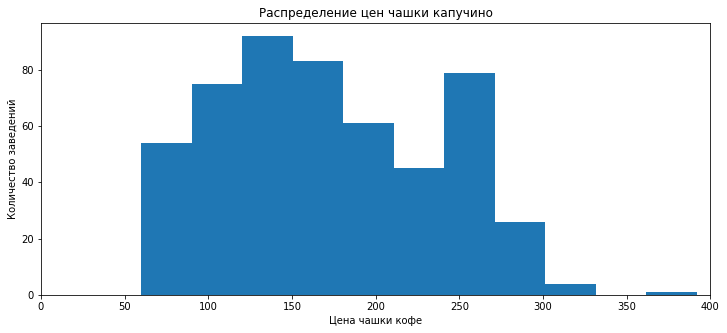

In [63]:
plt.figure(figsize=(12,5))
plt.hist(coffee_price, bins=50)
plt.xlim(0,400)
plt.xlabel('Цена чашки кофе')
plt.ylabel('Количество заведений')
plt.title('Распределение цен чашки капучино');

Большинство заведений предлагают чашку коые за 100-300 рублей. Цены распределены неравномерно, есть два пика в районе 150 и 260 рублей. Заведений, которые продают кофе дешевле 100 рублей не так много, а дороже 300 - практически нет.

In [64]:
coffee_price_district = coffee.groupby('district')['middle_coffee_cup'].mean().sort_values(ascending=False)
coffee_price_district

district
Западный административный округ            189.938776
Центральный административный округ         187.518519
Юго-Западный административный округ        184.176471
Восточный административный округ           174.023810
Северный административный округ            165.789474
Северо-Западный административный округ     165.523810
Северо-Восточный административный округ    165.333333
Южный административный округ               158.488372
Юго-Восточный административный округ       151.088235
Name: middle_coffee_cup, dtype: float64

In [65]:
fig = px.bar(coffee_price_district,
            labels= {'district':'Район', 'value':'Средняя цена'},
            title = 'Средняя цена чашки кофе в разных районах',
            color = coffee_price_district,
            color_continuous_scale = 'Blues')
fig.show()

Самые высокие цены на чашку кофе в центральных районах (Западный округ и Центральный). А самые низкие - в более удалённых от центра районах (Южном и Юго-Восточных округах), что может быть связано с категориями заведений и ориентированностью на местных жителей.

# Вывод по открытию кофейни

Открытие кофейни, похожей на кофейню из всеми любимого сериала Друзья, является очень увлекательной, но непростой задачей. Следует обратить внимание на несколько факторов, которые могут повлиять на принятие решения по поводу открытия кофейни.  

В первую очередь, конечно же, нужно обратить внимание на конкуренцию. Как мы выяснили, в Центральном округе - более 400 кофеен. Это, с одной стороны, говорит о большой конкуренции, но с другой - показывает большой спрос на заведения такого типа, а значит - потенциал на рынке. Но для того, чтобы чем-то отличаться от конкурентов, кофейня должна обладать какими-то уникальными характеристиками (интерьер, необычное тематическое меню, атмосфера).  
Что касается расположения, то тут существует несколько альтернатив. Кофейню можно открыть в центре - здесь большая проходимость, много туристов и в центре обычно удобнее встречаться на чашку кофе. Но здесь будут высокие цены на аренду, а значит - необходимы большие начальные инвестиции.  

Районы удалённые от центра будут более доступны по стоимости аренды, но проходимость здесь будет меньше, и, клиенты будут ожидать более низкие цены.  
Важно решить - выбрать ли расположение в центре с высокой конкуренцией, или в более отдалённых районах, чтобы заполнить там нишу.   

Что касается ценовой политики, она тоже во многом будет зависеть от расположения. Средняя цена чашки кофе по городу, как мы выяснили, составляет 175 рублей. В центральном же районе эта цена составляет 190 рублей. Стоимость кофе в новой кофейне должна быть в разумных пределах, чтобы поддерживать конкурентоспособность, но не снижать качество напитков и обслуживания.  
Для начала, можно установить цены в районе средних по городу(около 180 рублей), чтобы сделать кофе доступным для широкой аудитории, а так же можно сделать скидки для постоянных клиентов, студентов.  
Важно создать и уникальную атмосферу - в сериале кофейня стала популярной именно благодаря своей уникальной атмосфере. Поэтому в новой кофейне важно так же продумать концепцию, чтобы фанаты сериала чувствовали себя как в настоящей кофейне из сериала, но и чтобы там было приятно проводить время за чашечкой кофе даже тем, кто не является фанатом, а хочет просто попить кофе.  

Можно подытожить, что открыть кофейню в стиле Cental Perk реальна, но требует внимательного выбора места, ценообразования и создания уникальной обстановки.  
Поскольку наши клиенты не боятся конкуренции - кофейню лучше открыть в Центральном округе - там боле проходимость, удобная транспортная доступность, и заведения с более высоким рейтингом. Цену за чашку кофе можно установить в районе 180 рублей, что сделает кофейню доступной для всех желающих. И так же стоит поработать над атмосферой, интерьером и тематическим меню.